In [1]:
import pandas as pd
import numpy as np
from dotenv import load_dotenv
import os
import warnings


# Load environment variables
_ = load_dotenv()

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Configuration to suppress warnings
warnings.filterwarnings('ignore')

# Additional configurations for better control over visualizations (optional)
plt.style.use('ggplot')  # For ggplot-like style in plots
pd.options.display.max_columns = None  # Ensure all columns are visible when displaying DataFrames


In [3]:
import matplotlib.dates as mdates
import plotly.express as px



In [4]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tsa.stattools import adfuller
import plotly.graph_objects as go
from ipywidgets import interact, Dropdown
from plotly.subplots import make_subplots
import matplotlib.ticker as ticker
import statsmodels.api as sm



In [5]:
from dash import Dash, html, dcc, Input, Output
import dash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
import ipywidgets as widgets
from ipywidgets import interact, IntSlider, Dropdown, IntRangeSlider
import ipywidgets as widgets

from dash import dcc, html





## Load the Dateset

In [6]:
# Define the path to the dataset
file_path = '/Users/justinfarnan_hakkoda/capstone_project/Capstone_Project/RAW_Data/updated_data_715.csv'

# Load the dataset
df = pd.read_csv(file_path)

## Intitial Cleaning, Data Interpolation and Frequency Setting

In [7]:
# Remove the 'Unnamed: 0' column and other columns as it's redundant
df.drop(columns=['Unnamed: 0','load_dt'], inplace=True)

# Convert 'time' column to datetime format
df['time'] = pd.to_datetime(df['time'])

# Sort the DataFrame by the 'time' column
df.sort_values(by='time', ascending=True, inplace=True)

# Set 'time' as the index of the DataFrame
df.set_index('time', inplace=True)

# Calculate daily percentage change in 'close' price
#df['pct_change'] = df['close'].pct_change() # Keeping it in decimal format for more accurate results
# Group the DataFrame by 'product_id' and then apply the percentage change to the 'close' column
df['pct_change'] = df.groupby('product_id')['close'].pct_change()

# Display the first few rows of the updated DataFrame
df.head()


# Print the updated DataFrame to verify changes
print("Updated DataFrame with Daily Frequency and Interpolated Values:")
print(df.head())

# Review unique counts of product IDs if necessary
print("\nCount of unique product IDs:")
print(df['product_id'].value_counts())

Updated DataFrame with Daily Frequency and Interpolated Values:
                  low       high       open      close        volume  \
time                                                                   
2021-07-16  1850.1500  1965.3500  1918.9900  1877.2200  1.842217e+05   
2021-07-16   367.1000   410.5000   398.4500   367.8900  2.381554e+04   
2021-07-16    26.2040    29.4800    28.5750    26.2960  3.369130e+05   
2021-07-16    15.9297    17.5908    17.0647    16.3449  5.165473e+05   
2021-07-16     1.1661     1.2452     1.2249     1.1714  3.676491e+07   

            price_change  average_price  volatility product_id  pct_change  
time                                                                        
2021-07-16      -41.7700     1907.75000    6.226522    ETH-USD         NaN  
2021-07-16      -30.5600      388.80000   11.822392   COMP-USD         NaN  
2021-07-16       -2.2790       27.84200   12.501908    SOL-USD         NaN  
2021-07-16       -0.7198       16.76025   10.4

In [8]:
df.isnull().sum()

low               0
high              0
open              0
close             0
volume            0
price_change      0
average_price     0
volatility        0
product_id        0
pct_change       10
dtype: int64

In [9]:
# Calculate the percentage change per each coin separately
df['pct_change'] = df.groupby('product_id')['close'].pct_change() * 100

# Compute the average percentage change for each coin
avg_pct_change = df.groupby('product_id')['pct_change'].transform(lambda x: x.fillna(x.mean()))

# Fill NaN values with the average percentage change per coin
df['pct_change'] = df['pct_change'].fillna(avg_pct_change)

# Check the updated DataFrame
print(df)

                   low        high        open       close        volume  \
time                                                                       
2021-07-16   1850.1500   1965.3500   1918.9900   1877.2200  1.842217e+05   
2021-07-16    367.1000    410.5000    398.4500    367.8900  2.381554e+04   
2021-07-16     26.2040     29.4800     28.5750     26.2960  3.369130e+05   
2021-07-16     15.9297     17.5908     17.0647     16.3449  5.165473e+05   
2021-07-16      1.1661      1.2452      1.2249      1.1714  3.676491e+07   
...                ...         ...         ...         ...           ...   
2024-07-08  54278.9300  58200.0000  55852.6100  56699.4300  1.904292e+04   
2024-07-08    127.7500    141.9300    131.5900    139.7700  1.308320e+06   
2024-07-08     43.7500     48.9200     45.0400     47.4500  1.442337e+04   
2024-07-08      0.4600      0.5148      0.4778      0.5018  9.861542e+06   
2024-07-08     11.7750     13.5240     12.3530     13.1230  2.352508e+06   

           

### Summary Statistics

In [10]:
# Identify numeric columns for statistical analysis
numeric_cols = df.select_dtypes(include=[np.number])  # This selects all the columns that are of numeric type

# Group by 'product_id' and calculate basic statistics for numeric columns
grouped_stats = df.groupby('product_id')[numeric_cols.columns].agg(['mean', 'std', 'min', 'max'])

# Calculate skewness and kurtosis separately using apply() for compatibility
skewness = df.groupby('product_id')[numeric_cols.columns].apply(lambda x: x.skew()).rename(columns=lambda x: x + '_skew')
kurtosis = df.groupby('product_id')[numeric_cols.columns].apply(lambda x: x.kurt()).rename(columns=lambda x: x + '_kurtosis')

# Concatenate the skewness and kurtosis DataFrames to the grouped_stats DataFrame
detailed_stats = pd.concat([grouped_stats, skewness, kurtosis], axis=1)

print("\nDetailed Summary Statistics by Cryptocurrency:")
print(detailed_stats)



Detailed Summary Statistics by Cryptocurrency:
             (low, mean)    (low, std)  (low, min)  (low, max)  (high, mean)  \
product_id                                                                     
ADA-USD         0.693826      0.568090      0.2300      2.9045      0.746372   
AVAX-USD       34.061974     26.731678      8.6200    126.2500     37.334038   
BTC-USD     36476.653718  15079.334679  15460.0000  71337.3000  38135.471125   
COMP-USD      102.054493    106.422680     23.1500    475.2200    111.350507   
ETH-USD      2306.483164    883.238030    879.8000   4697.9000   2436.128007   
LINK-USD       12.508462      6.847953      4.9260     33.4000     13.527634   
LTC-USD        92.019649     39.399077     40.3200    259.2000     98.274880   
MATIC-USD       0.984159      0.413650      0.3162      2.7131      1.067077   
SOL-USD        72.710804     58.815262      8.0000    245.8000     79.517627   
UNI-USD         9.205171      6.137585      3.3240     29.5190      9.98

#### Interactive Time Series Plot

In [11]:
def generate_interactive_line_plot(df):
    """
    Generates an interactive line plot of percentage changes over time for different cryptocurrencies.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing the data with 'pct_change' and 'product_id' columns.
    
    Returns:
    fig (plotly.graph_objs._figure.Figure): The interactive plotly figure.
    """
    # Generate the interactive line plot
    fig = px.line(df, x=df.index, y='pct_change', color='product_id', 
                  title='Interactive Time Series of Percentage Changes',
                  labels={'pct_change': 'Percentage Change (%)', 'product_id': 'Cryptocurrency'})

    # Enhance the plot with a range slider for better navigation
    fig.update_xaxes(rangeslider_visible=True)

    # Update traces to be hidden by default
    for trace in fig.data:
        trace.visible = 'legendonly'

    return fig

fig = generate_interactive_line_plot(df)
fig.show()


### Distribution Analysis - Histograms

In [12]:
import plotly.express as px

def generate_histogram_plot(df):
    """
    Generates a histogram of percentage changes to analyze the distribution by cryptocurrency.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing the data with 'pct_change' and 'product_id' columns.
    
    Returns:
    fig (plotly.graph_objs._figure.Figure): The histogram plotly figure.
    """
    # Create a histogram of percentage changes
    fig = px.histogram(df, x='pct_change', color='product_id',
                       marginal='box',  # adds a boxplot alongside the histogram
                       barmode='overlay',
                       nbins=100,  # adjust the number of bins for better resolution
                       title='Distribution of Percentage Changes by Cryptocurrency')

    # Set all traces to be hidden by default, appear on legend click
    for trace in fig.data:
        trace.visible = 'legendonly'

    fig.update_layout(
        barmode='overlay',  # Overlays bars on top of each other
        bargap=0.1          # Sets gap between bars of adjacent location coordinates.
    )

    return fig
fig = generate_histogram_plot(df)
fig.show()

### Interactive Scatter Plot of Percentage Change vs. Volume

In [13]:
def generate_scatter_plot(df):
    """
    Generates a scatter plot of percentage change vs. volume by cryptocurrency.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing the data with 'volume', 'pct_change', and 'product_id' columns.
    
    Returns:
    fig (plotly.graph_objs._figure.Figure): The scatter plotly figure.
    """
    # Generate the scatter plot of percentage change vs volume
    fig = px.scatter(df, x='volume', y='pct_change', color='product_id',
                     title='Volume vs. Percentage Change by Cryptocurrency',
                     labels={'volume': 'Trading Volume', 'pct_change': 'Percentage Change (%)'})

    # Set all traces to be hidden by default, appear on legend click
    for trace in fig.data:
        trace.visible = 'legendonly'

    return fig
fig = generate_scatter_plot(df)
fig.show()


### Day of the Week Analysis

In [14]:
def generate_avg_pct_change_by_day_plot(df):
    """
    Generates an interactive line plot of average percentage change by day of the week for each cryptocurrency.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing the data with 'pct_change', 'product_id', and a datetime index.
    
    Returns:
    fig (plotly.graph_objs._figure.Figure): The interactive plotly figure.
    """
    # Extract day of the week and map it to day names
    df['day_of_week'] = df.index.dayofweek
    day_map = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
    df['day_name'] = df['day_of_week'].map(day_map)

    # Calculate average percentage change by day of the week for each product
    avg_pct_change_by_day = df.groupby(['product_id', 'day_of_week', 'day_name'])['pct_change'].mean().reset_index()

    # Ensure the data is sorted by day of the week to avoid plotting issues
    avg_pct_change_by_day.sort_values(by=['product_id', 'day_of_week'], inplace=True)

    # Generate the interactive line plot
    fig = px.line(avg_pct_change_by_day, x='day_name', y='pct_change', color='product_id',
                  title='Average Percentage Change by Day of the Week',
                  labels={'day_name': 'Day of the Week', 'pct_change': 'Average Percentage Change (%)'},
                  category_orders={'day_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']})

    # Set all traces to be hidden by default, appear on legend click
    for trace in fig.data:
        trace.visible = 'legendonly'

    return fig

fig = generate_avg_pct_change_by_day_plot(df)
fig.show()

#### Time Series Visualization with Trend Lines

In [15]:
def generate_subplots_with_trendlines(df):
    """
    Generates a subplot layout with percentage change and trend lines for each cryptocurrency.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing the data with 'pct_change', 'product_id', and a datetime index.
    
    Returns:
    fig (plotly.graph_objs._figure.Figure): The subplot layout plotly figure.
    """
    # Create a subplot layout
    num_products = len(df['product_id'].unique())
    fig = make_subplots(rows=num_products, cols=1, shared_xaxes=True, vertical_spacing=0.02)

    # Iterate over each unique cryptocurrency for plotting
    for i, (label, df_product) in enumerate(df.groupby('product_id')):
        df_product = df_product.dropna(subset=['pct_change'])  # Drop NaN values for clean plotting
        if len(df_product) > 1:
            # Add line trace for percentage changes
            fig.add_trace(go.Scatter(x=df_product.index, y=df_product['pct_change'],
                                     mode='lines', name=f'{label} % Change'), row=i+1, col=1)
            
            # Add trend line using numpy's polyfit
            valid_dates = df_product.index
            coefficients = np.polyfit(range(len(df_product)), df_product['pct_change'], 1)
            trendline = np.polyval(coefficients, range(len(df_product)))
            fig.add_trace(go.Scatter(x=valid_dates, y=trendline,
                                     mode='lines', name=f'{label} Trend', line=dict(dash='dash')), row=i+1, col=1)

            # Update y-axis properties for better readability
            fig.update_yaxes(title_text=f'{label} Percentage Change (%)', row=i+1, col=1, ticksuffix="%", tickangle=-45)

    # Update layout to make it cleaner
    fig.update_layout(height=300 * num_products, width=1100, title_text="Percentage Change with Trend Lines by Cryptocurrency")
    fig.update_xaxes(title_text="Time")
    fig.update_layout(legend=dict(
        orientation="v",
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=1.02
    ))

    # Set all traces to be hidden by default, appear on legend click
    for trace in fig.data:
        trace.visible = 'legendonly'

    return fig

# Example usage
fig = generate_subplots_with_trendlines(df)
fig.show()


In [19]:
# Function to add technical indicators for each product_id
def add_technical_indicators(group):
    group['pct_change'] = group['close'].pct_change()

    # Adding lag features for close prices and volume
    for lag in [1, 3, 7]:  # Example lags: previous day, 3 days ago, and a week ago
        group[f'close_lag_{lag}'] = group['close'].shift(lag)
        group[f'volume_lag_{lag}'] = group['volume'].shift(lag)

    # Calculate Moving Average (MA)
    group['close_MA10'] = group['close'].rolling(window=10).mean()

    # Calculate Exponential Moving Average (EMA) for different periods
    for window in [7, 14, 30]:
        group[f'close_ema_{window}'] = group['close'].ewm(span=window, adjust=False).mean()

    # Calculate Relative Strength Index (RSI)
    delta = group['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    group['RSI'] = 100 - (100 / (1 + rs))

    # Calculate Moving Average Convergence Divergence (MACD)
    exp1 = group['close'].ewm(span=12, adjust=False).mean()
    exp2 = group['close'].ewm(span=26, adjust=False).mean()
    group['MACD'] = exp1 - exp2
    group['Signal_Line'] = group['MACD'].ewm(span=9, adjust=False).mean()

    # Calculate Rolling Volatility
    for window in [7, 14, 30]:
        group[f'volatility_{window}d'] = group['pct_change'].rolling(window=window).std() * np.sqrt(window)

    # Calculate Market Momentum
    for window in [1, 7, 30]:  # momentum over 1 day, 1 week, and 1 month
        group[f'momentum_{window}d'] = group['close'] / group['close'].shift(window) - 1

    return group

In [20]:
# Apply the function to each group
# df_new = df.reset_index(drop=True)
df_new = df.groupby('product_id').apply(add_technical_indicators)

# Reset the index correctly and store it in df_new_reset
# Drop the existing 'product_id' column if it exists
if 'product_id' in df_new.columns:
    df_new = df_new.drop(columns=['product_id'])

# Drop the existing 'time' column if it exists
if 'time' in df_new.columns:
    df_new = df_new.drop(columns=['time'])
df_new_reset = df_new.reset_index(level=['product_id', 'time'])

# Ensure 'time' and 'product_id' columns exist and are in the correct format
# df_new_reset['time'] = pd.to_datetime(df_new_reset['time'])
# df_new_reset['product_id'] = df_new_reset['product_id'].astype(str)
# # df_new_reset.drop(columns=['index'], inplace = True)
df_new_reset.head()

,product_id,time,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,day_name,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
0,ADA-USD,2021-07-16,1.1661,1.2452,1.2249,1.1714,36764908.57,-0.0535,1.20565,6.783295,NaN,4,Friday,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.171400,1.171400,1.171400,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
1,ADA-USD,2021-07-17,1.1503,1.1954,1.1714,1.1730,30485996.64,0.0016,1.17285,3.920716,0.001366,5,Saturday,1.1714,36764908.57,NaN,NaN,NaN,NaN,NaN,1.171800,1.171613,1.171503,NaN,0.000128,0.000026,NaN,NaN,NaN,0.001366,NaN,NaN
2,ADA-USD,2021-07-18,1.1674,1.2193,1.1731,1.1815,20204036.80,0.0084,1.19335,4.445777,0.007246,6,Sunday,1.1730,30485996.64,NaN,NaN,NaN,NaN,NaN,1.174225,1.172932,1.172148,NaN,0.000904,0.000201,NaN,NaN,NaN,0.007246,NaN,NaN
3,ADA-USD,2021-07-19,1.1159,1.1922,1.1816,1.1226,38666530.06,-0.0590,1.15405,6.837530,-0.049852,0,Monday,1.1815,20204036.80,1.1714,36764908.57,NaN,NaN,NaN,1.161319,1.166221,1.168952,NaN,-0.003196,-0.000478,NaN,NaN,NaN,-0.049852,NaN,NaN
4,ADA-USD,2021-07-20,1.0250,1.1365,1.1228,1.0559,98783713.28,-0.0669,1.08075,10.878049,-0.059416,1,Tuesday,1.1226,38666530.06,1.1730,30485996.64,NaN,NaN,NaN,1.134964,1.151511,1.161658,NaN,-0.011693,-0.002721,NaN,NaN,NaN,-0.059416,NaN,NaN


In [16]:
# df_new_reset.isnull().sum()

NameError: name 'df_new_reset' is not defined

### Visualize Rolling Volatility

In [21]:
# Interactive plot for rolling volatility

fig = px.line(df_new_reset.reset_index(), x='time', y='volatility_30d', color='product_id',
              labels={'volatility_30d': '30-Day Volatility'},
              title='30-Day Rolling Volatility for Each Cryptocurrency')

# Update to make individual lines selectable
fig.update_traces(visible="legendonly")  # Make all lines invisible by default; they appear when clicked in legend.

fig.update_xaxes(rangeslider_visible=True)
fig.show()

### Interactive Market Momentum

In [ ]:
# Interactive plot for market momentum
fig_momentum = px.line(df_new_reset.reset_index(), x='time', y='momentum_30d', color='product_id',
                       labels={'momentum_30d': '30-Day Momentum'},
                       title='30-Day Market Momentum for Each Cryptocurrency')

# Update to make individual lines selectable
fig_momentum.update_traces(visible="legendonly")  # Make all lines invisible by default; they appear when clicked in legend.

fig_momentum.update_xaxes(rangeslider_visible=True)
fig_momentum.show()

### Interactive Box Plot for Seasonal Patterns

In [22]:
# Mapping numerical days to day names
days = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
df_new_reset['day_name'] = df_new_reset['day_of_week'].map(days)

# Interactive box plot for day of the week effects, focusing on percentage change
fig_season = px.box(df_new_reset.reset_index(), x='day_name', y='pct_change', color='product_id',
                    labels={'day_name': 'Day of the Week', 'pct_change': 'Percentage Change'},
                    title='Percentage Change Distribution by Day of Week for Each Cryptocurrency')

# Update the traces to be toggleable via the legend, this is a workaround since 'legendonly' isn't directly available
for trace in fig_season.data:
    trace.visible = "legendonly"  # Hide all traces; they appear when their legend entry is clicked.

fig_season.show()

### Interactive Exponential Moving Averages and Percentage Change

In [23]:
# Interactive plot for EMA and Percentage Changes
fig_ema = px.line(df_new_reset.reset_index(), x='time', y=['pct_change', 'close_ema_30'], color='product_id',
                  labels={'value': 'Percentage', 'variable': 'Type'},
                  title='Percentage Changes and 30-Day Exponential Moving Averages')

# Update the traces to make individual lines selectable via the legend
fig_ema.update_traces(visible="legendonly")  # Make all lines invisible by default; they appear when clicked in legend.

fig_ema.update_xaxes(rangeslider_visible=True)
fig_ema.show()

In [24]:
# Data preparation
df_long = df_new_reset.reset_index().melt(id_vars=['time', 'product_id'], value_vars=['pct_change', 'close_ema_30'],
                                var_name='Type', value_name='Value')

# Interactive plot for EMA and Percentage Changes
fig_ema = px.line(df_long, x='time', y='Value', color='product_id', line_dash='Type',
                  labels={'Value': 'Percentage', 'Type': 'Metric'},
                  title='Percentage Changes and 30-Day Exponential Moving Averages',
                  color_discrete_map={'pct_change': 'blue', 'close_ema_30': 'red'})

# Update the traces to make individual lines selectable via the legend
fig_ema.for_each_trace(lambda t: t.update(visible="legendonly"))

# Customization for a clearer legend and range slider
fig_ema.update_traces(mode='lines')
fig_ema.update_xaxes(rangeslider_visible=True)
fig_ema.update_layout(legend_title_text='Cryptocurrency and Metric')

fig_ema.show()

### Analysis of Percentage Changes and 30-Day EMAs Across Cryptocurrencies

In [25]:
# Data preparation for plotting
df_eda = df_new_reset.reset_index().melt(id_vars=['time', 'product_id'], value_vars=['pct_change', 'close_ema_30'],
                                var_name='Metric', value_name='Value')

# Interactive plot for Percentage Changes and 30-Day Exponential Moving Averages
fig_ema = px.line(df_eda, x='time', y='Value', color='product_id', line_dash='Metric',
                  labels={'Value': 'Percentage', 'Metric': 'Metric Type'},
                  title='Analysis of Percentage Changes and 30-Day EMAs Across Cryptocurrencies',
                  color_discrete_map={'pct_change': 'blue', 'close_ema_30': 'red'})

# Update the traces to make individual lines selectable via the legend
fig_ema.for_each_trace(lambda t: t.update(visible="legendonly"))

# Customize plot to enhance clarity
fig_ema.update_traces(mode='lines')
fig_ema.update_xaxes(rangeslider_visible=True)
fig_ema.update_layout(legend_title_text='Cryptocurrency and Metric')

fig_ema.show()

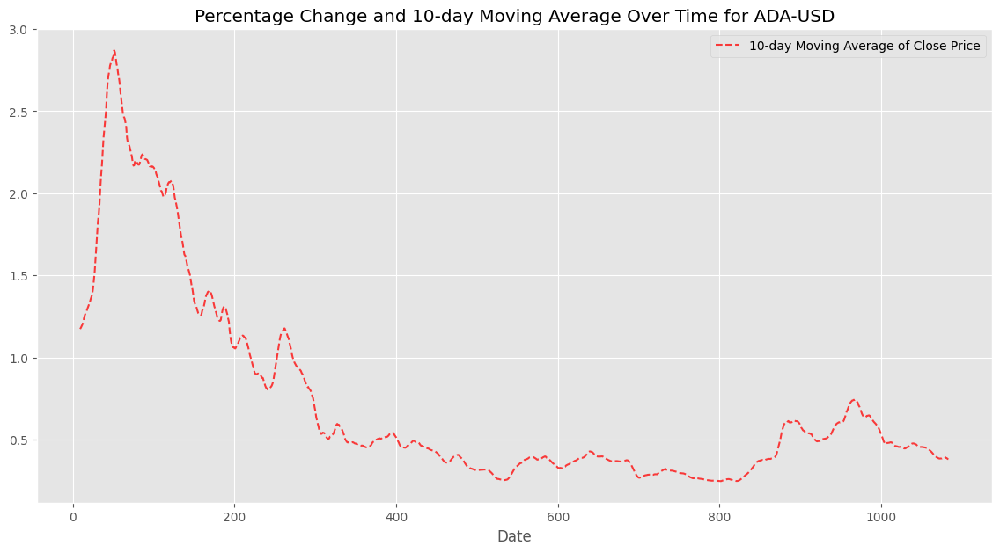

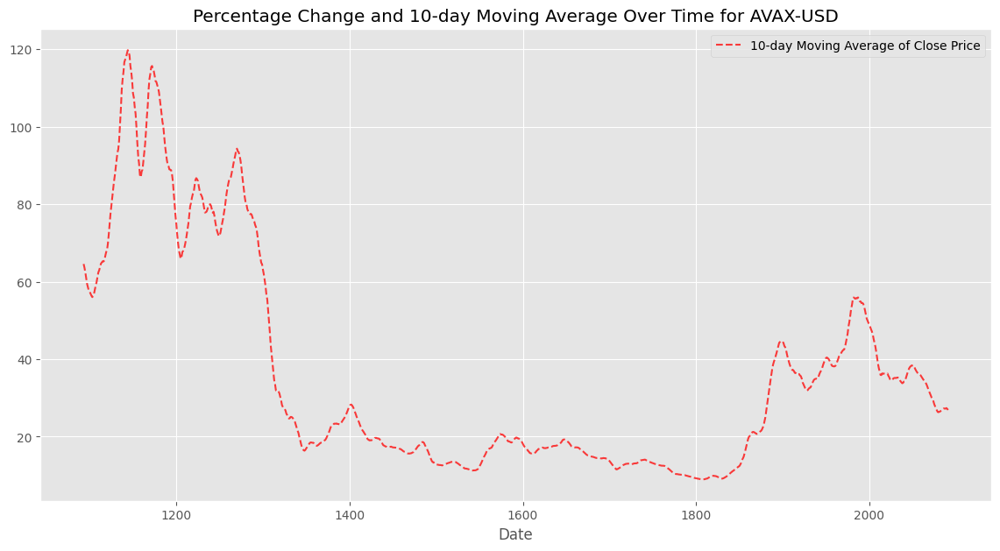

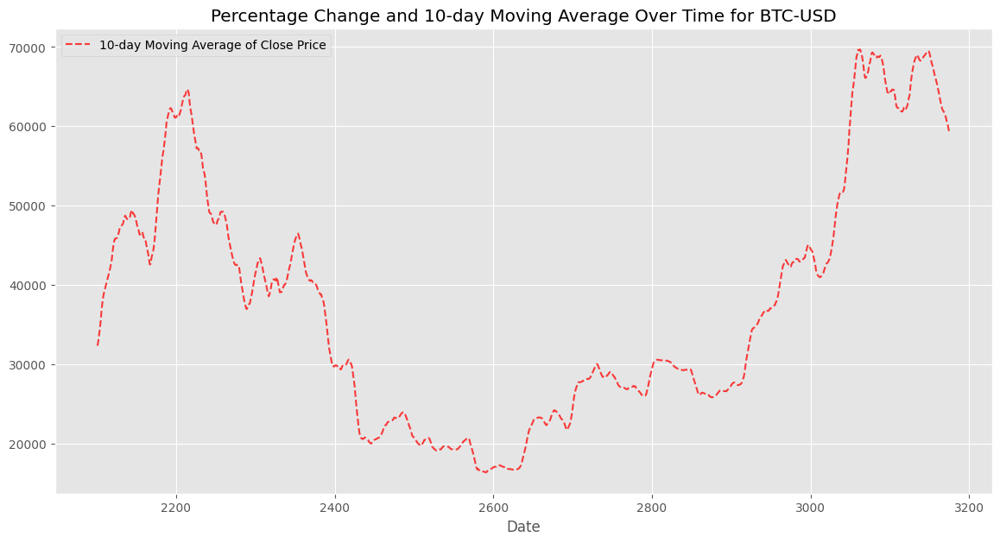

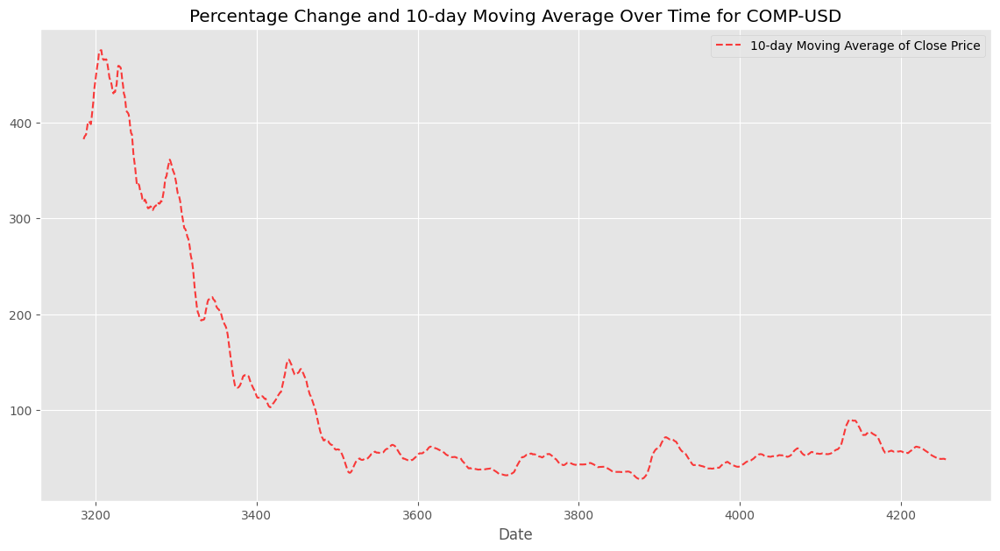

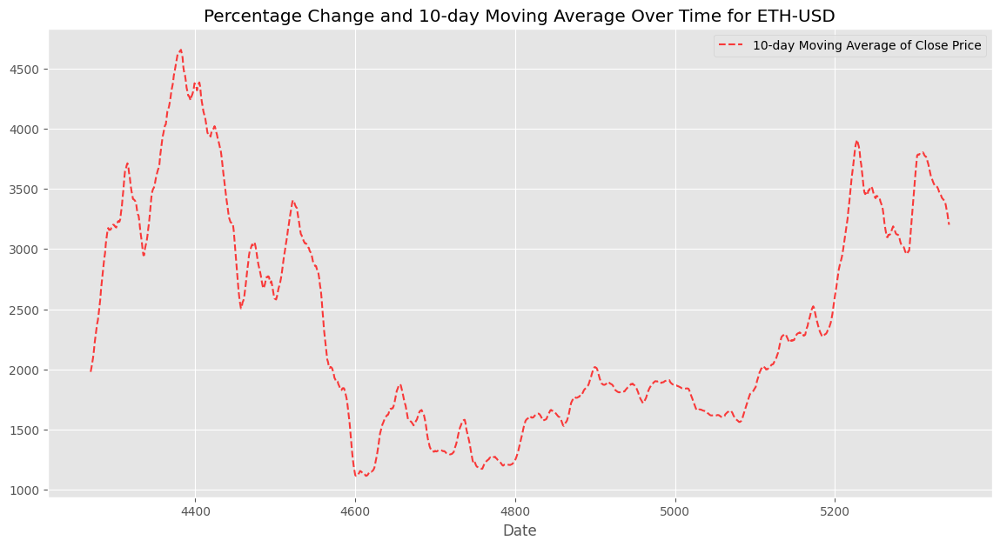

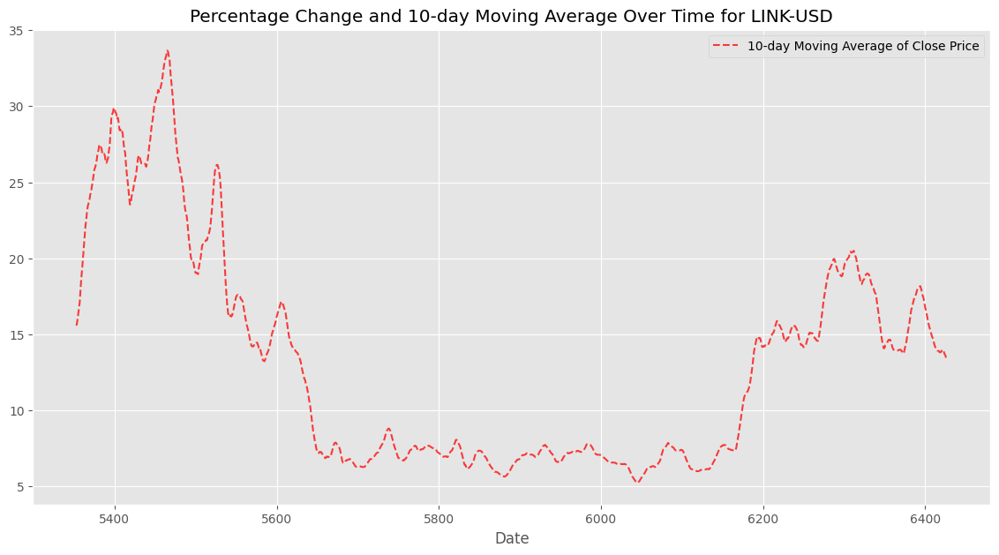

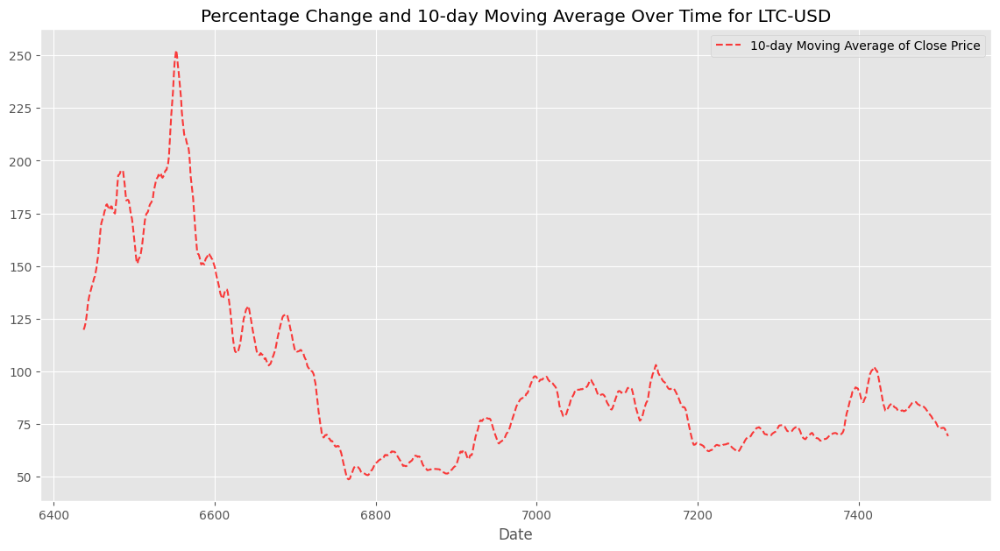

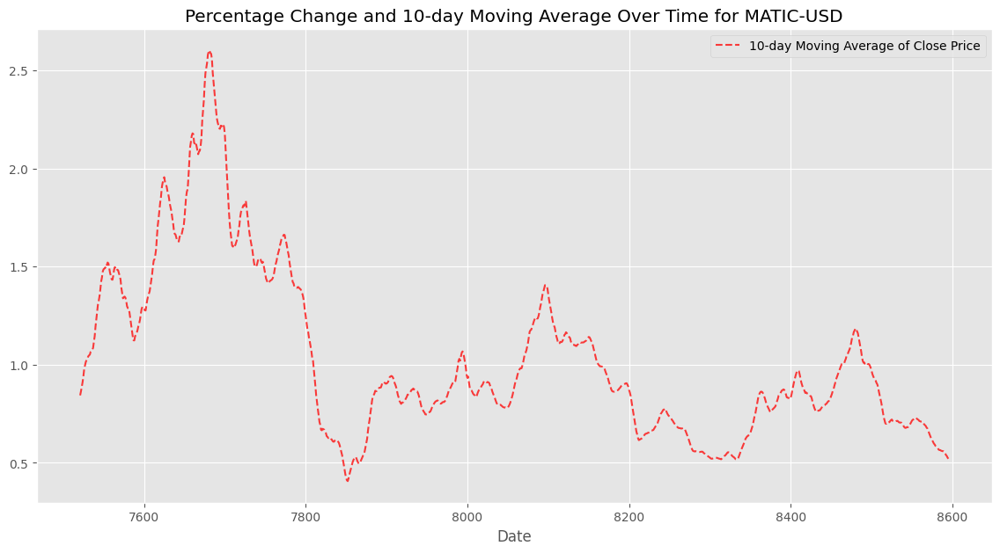

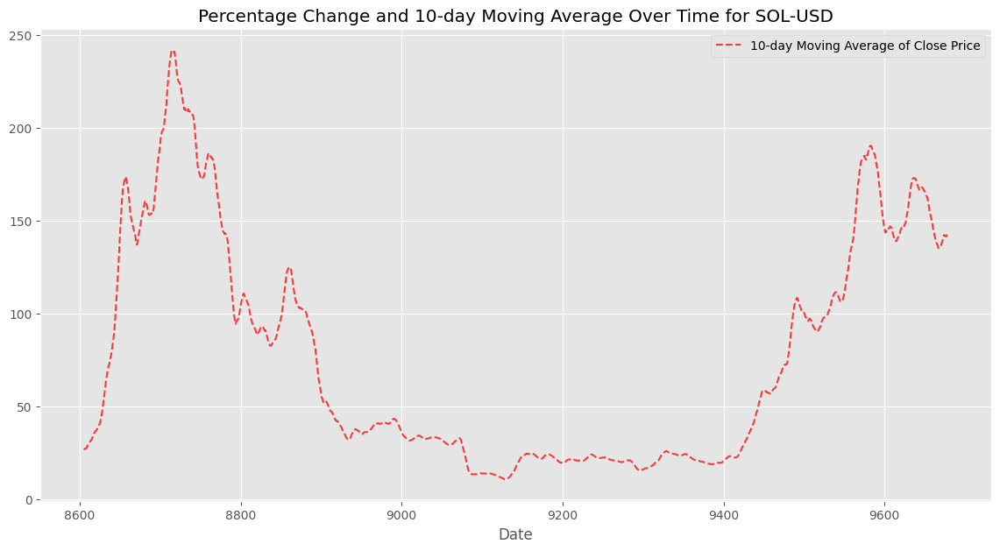

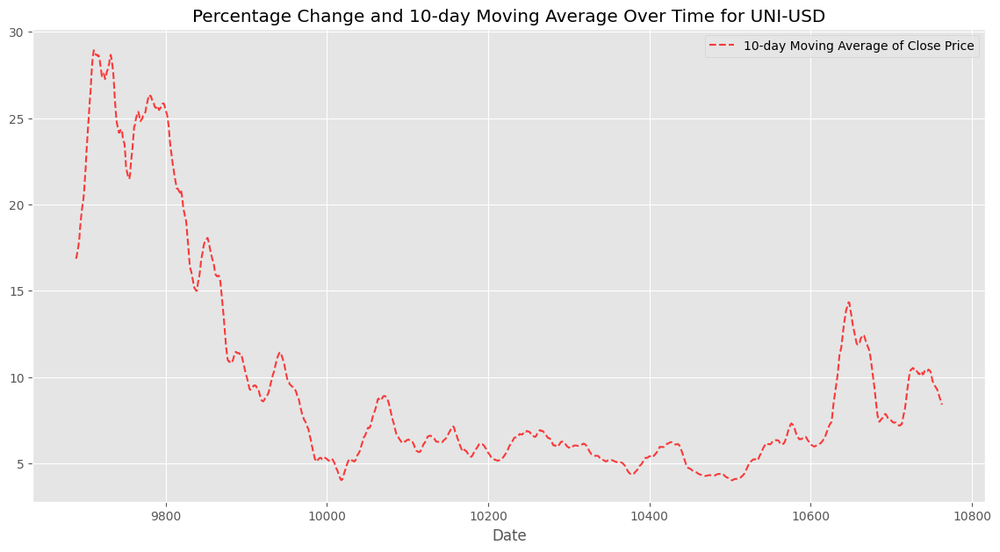

In [32]:
for coin in df_new_reset['product_id'].unique():
    plt.figure(figsize=(14, 7))
    coin_data = df_new_reset[df_new_reset['product_id'] == coin]
    # plt.plot(coin_data.index, coin_data['pct_change'], label='Percentage Change', color='blue')
    plt.plot(coin_data.index, coin_data['close_MA10'], label='10-day Moving Average of Close Price', alpha=0.75, linestyle='--', color='red')
    plt.title(f'Percentage Change and 10-day Moving Average Over Time for {coin}')
    plt.xlabel('Date')
    # plt.ylabel('Percentage Change')
    plt.legend()
    plt.show()

### Time Series of Percentage Changes and Moving Average for Each Cryptocurrency

In [27]:
print(df_new_reset.columns.tolist())

['product_id', 'time', 'low', 'high', 'open', 'close', 'volume', 'price_change', 'average_price', 'volatility', 'pct_change', 'day_of_week', 'day_name', 'close_lag_1', 'volume_lag_1', 'close_lag_3', 'volume_lag_3', 'close_lag_7', 'volume_lag_7', 'close_MA10', 'close_ema_7', 'close_ema_14', 'close_ema_30', 'RSI', 'MACD', 'Signal_Line', 'volatility_7d', 'volatility_14d', 'volatility_30d', 'momentum_1d', 'momentum_7d', 'momentum_30d']


In [28]:
print(df_new_reset.head())
print(df_new_reset.info())
print(df_new_reset.describe())

  product_id       time     low    high    open   close       volume  \
0    ADA-USD 2021-07-16  1.1661  1.2452  1.2249  1.1714  36764908.57   
1    ADA-USD 2021-07-17  1.1503  1.1954  1.1714  1.1730  30485996.64   
2    ADA-USD 2021-07-18  1.1674  1.2193  1.1731  1.1815  20204036.80   
3    ADA-USD 2021-07-19  1.1159  1.1922  1.1816  1.1226  38666530.06   
4    ADA-USD 2021-07-20  1.0250  1.1365  1.1228  1.0559  98783713.28   

   price_change  average_price  volatility  pct_change  day_of_week  day_name  \
0       -0.0535        1.20565    6.783295         NaN            4    Friday   
1        0.0016        1.17285    3.920716    0.001366            5  Saturday   
2        0.0084        1.19335    4.445777    0.007246            6    Sunday   
3       -0.0590        1.15405    6.837530   -0.049852            0    Monday   
4       -0.0669        1.08075   10.878049   -0.059416            1   Tuesday   

   close_lag_1  volume_lag_1  close_lag_3  volume_lag_3  close_lag_7  \
0       

### Dashboard

In [ ]:
#app.run_server(port=8051)
#if __name__ == '__main__':
#    app.run_server(port=8051)
# import dash
# import dash_html_components as html
# import dash_core_components as dcc

# app = dash.Dash(__name__)

# app.layout = html.Div([
#     # Header
#     html.Div([
#         html.H1("Crypto Price Analyzer"),
#         html.P("Select a product ID and date range to analyze:")
#     ]),
    
#     # Main Content
#     html.Div([
#         # Graphs and charts will go here
#     ]),
    
#     # Sidebar
#     html.Div([
#         # Settings and controls will go here
#     ])
# ])

# if __name__ == '__main__':
#     app.run_server(port=8051)

### Correlation Matrix of Numeric Features for Each Cryptocurrency

In [29]:
num_features = df_new_reset.select_dtypes(include=[np.number]).shape[1]
print(f"Number of numerical features: {num_features}")

Number of numerical features: 29


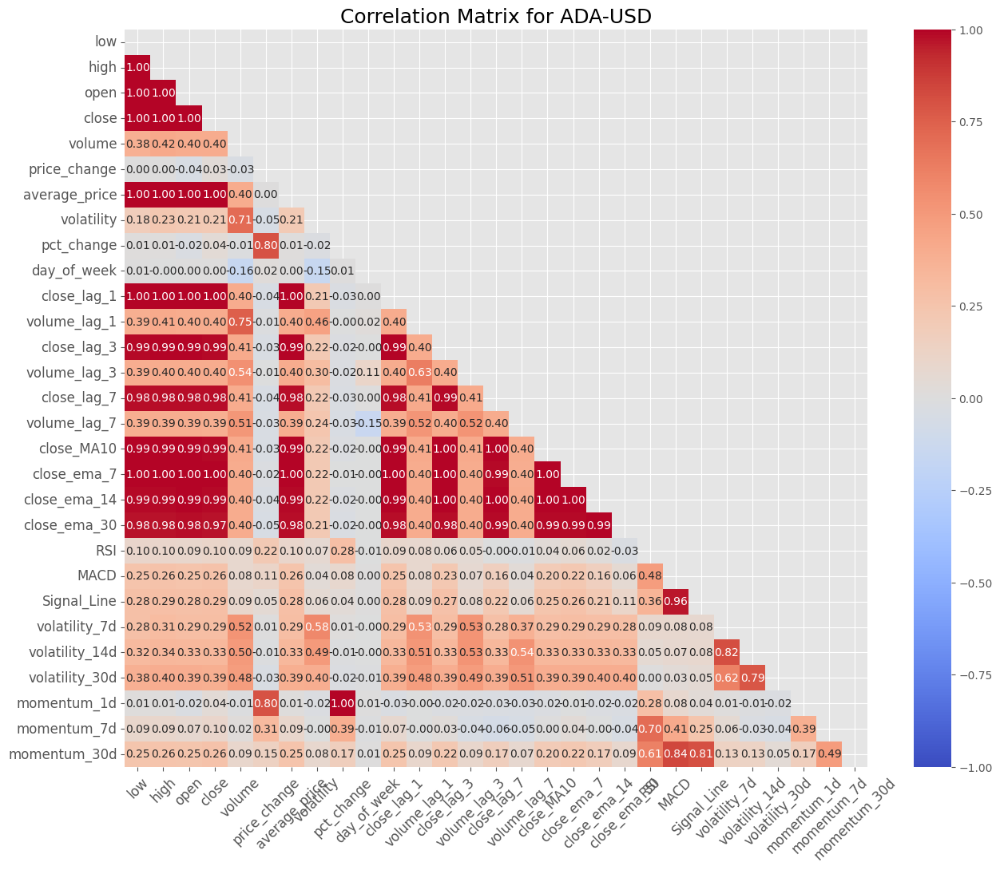

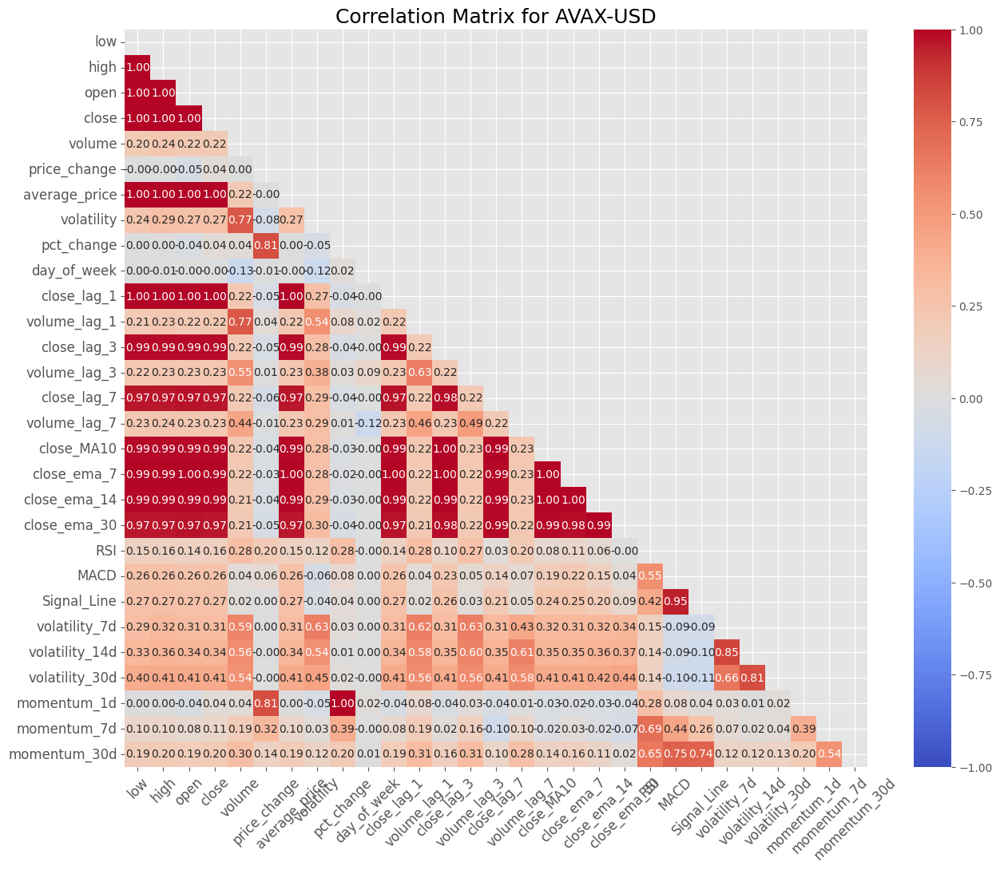

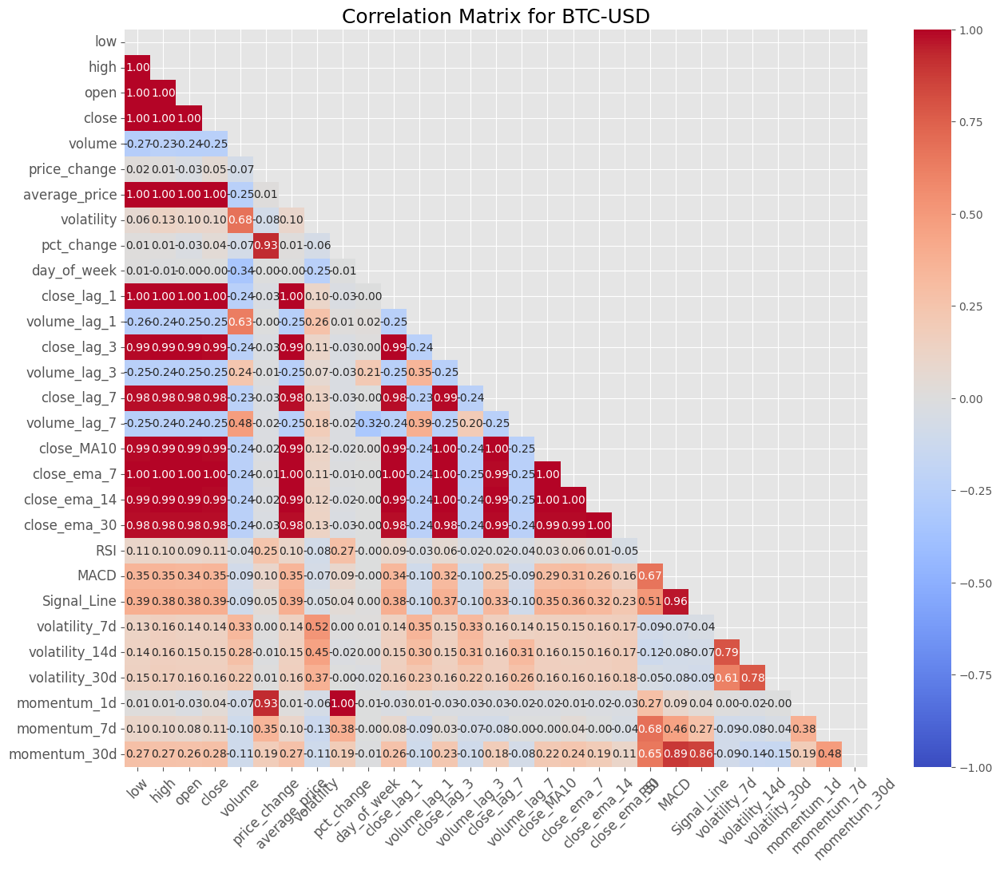

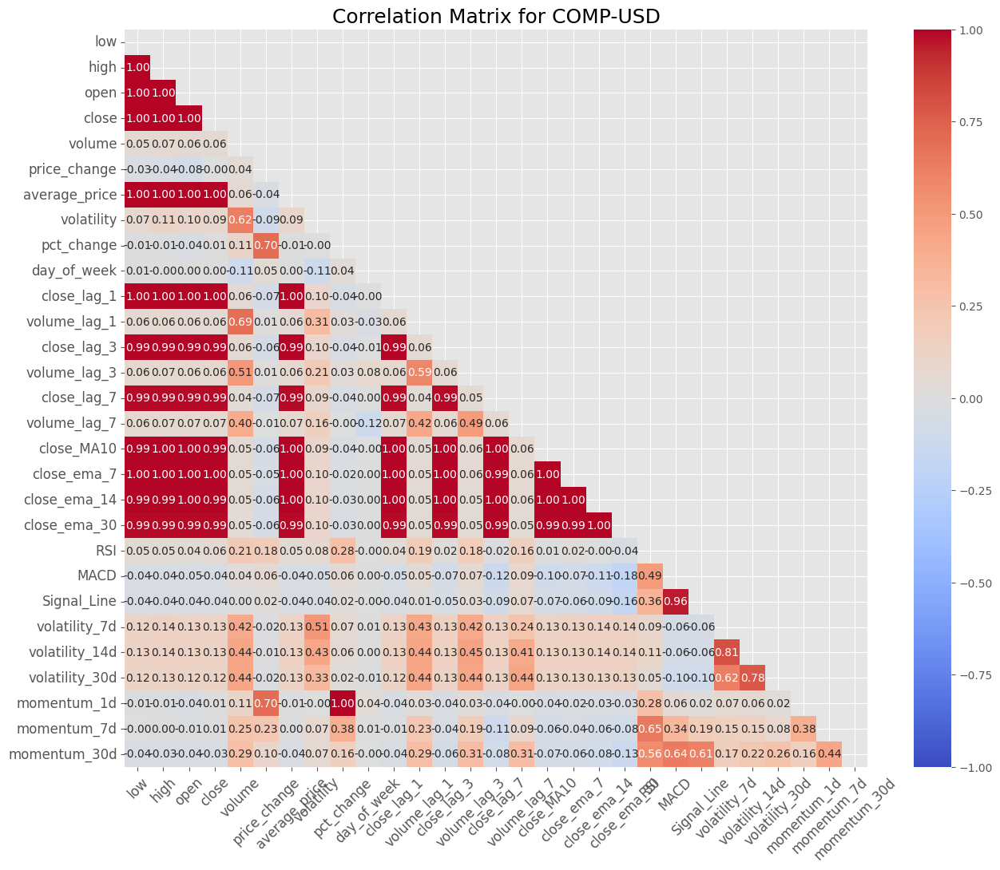

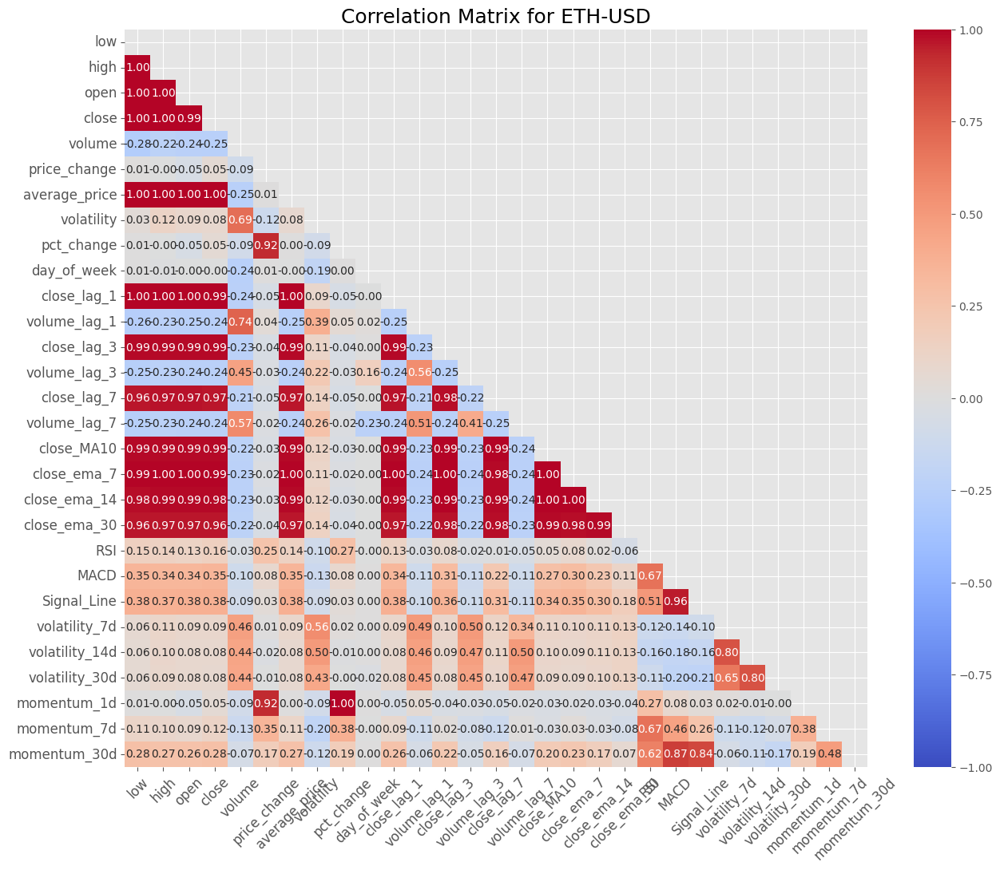

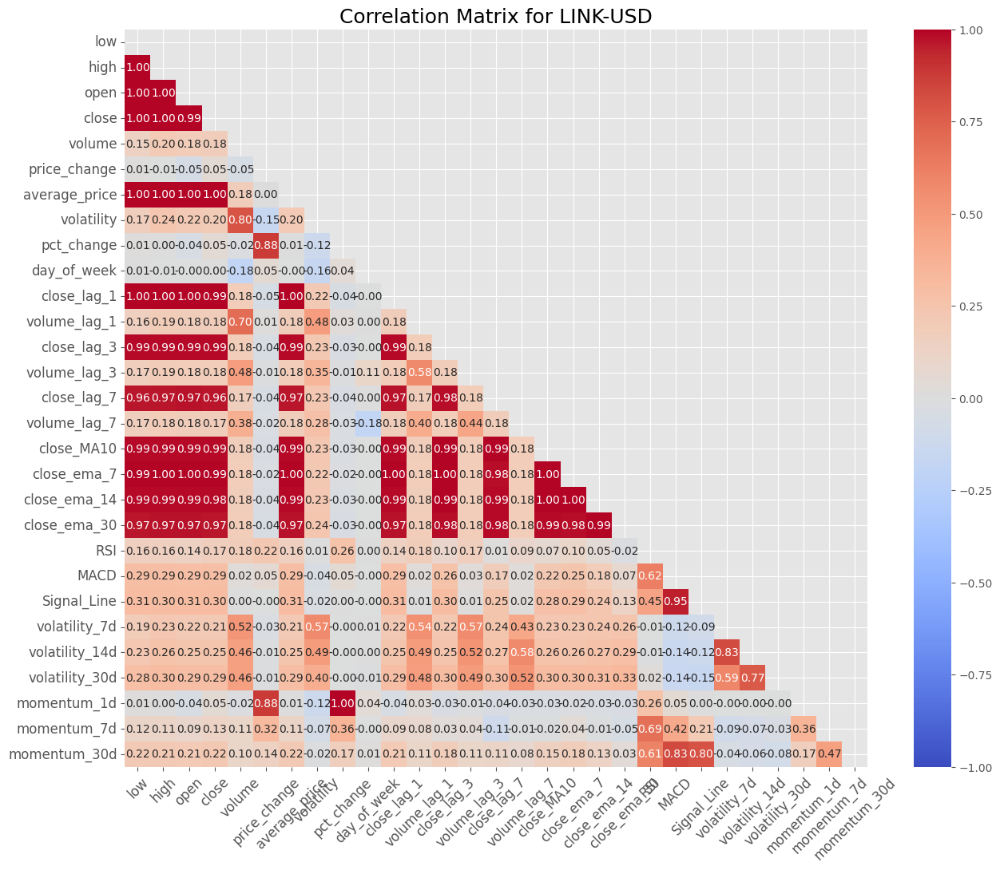

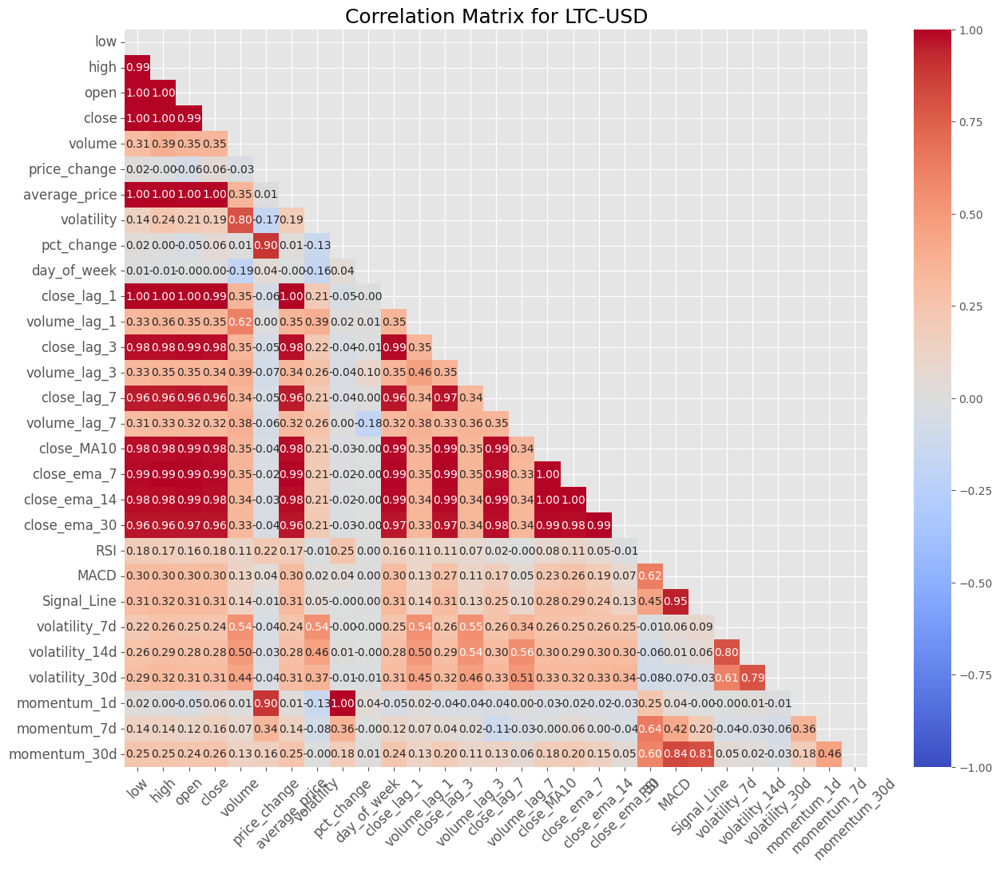

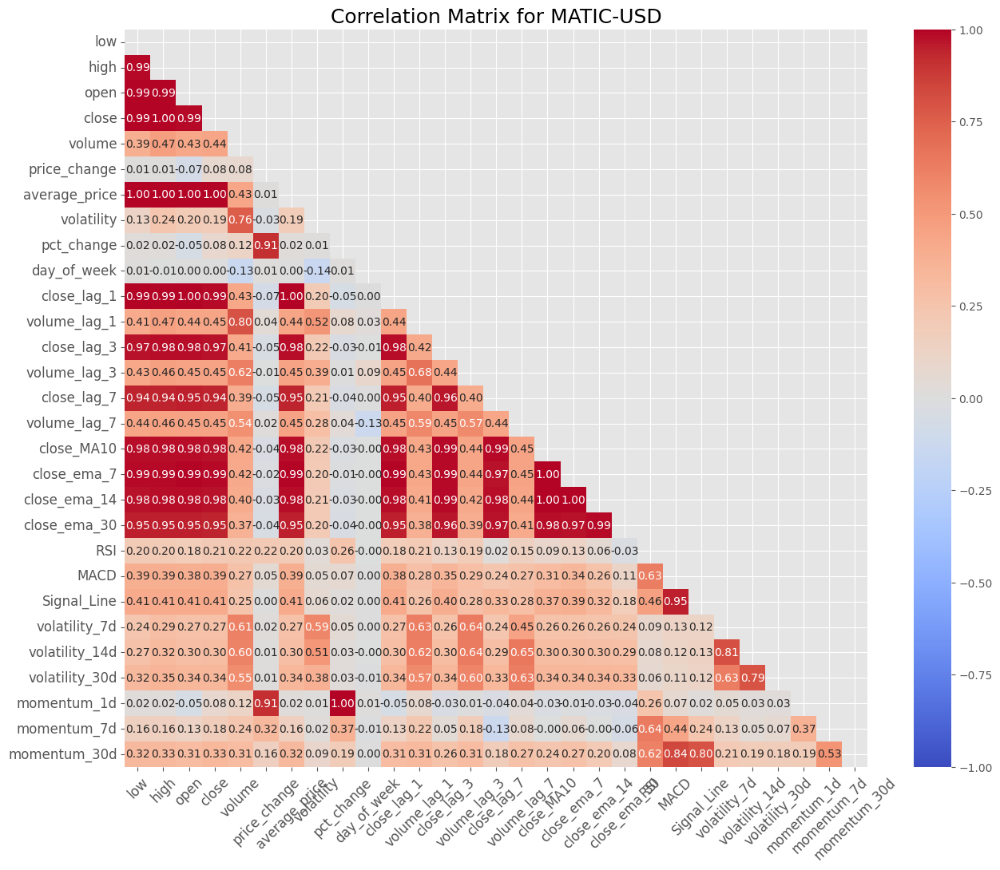

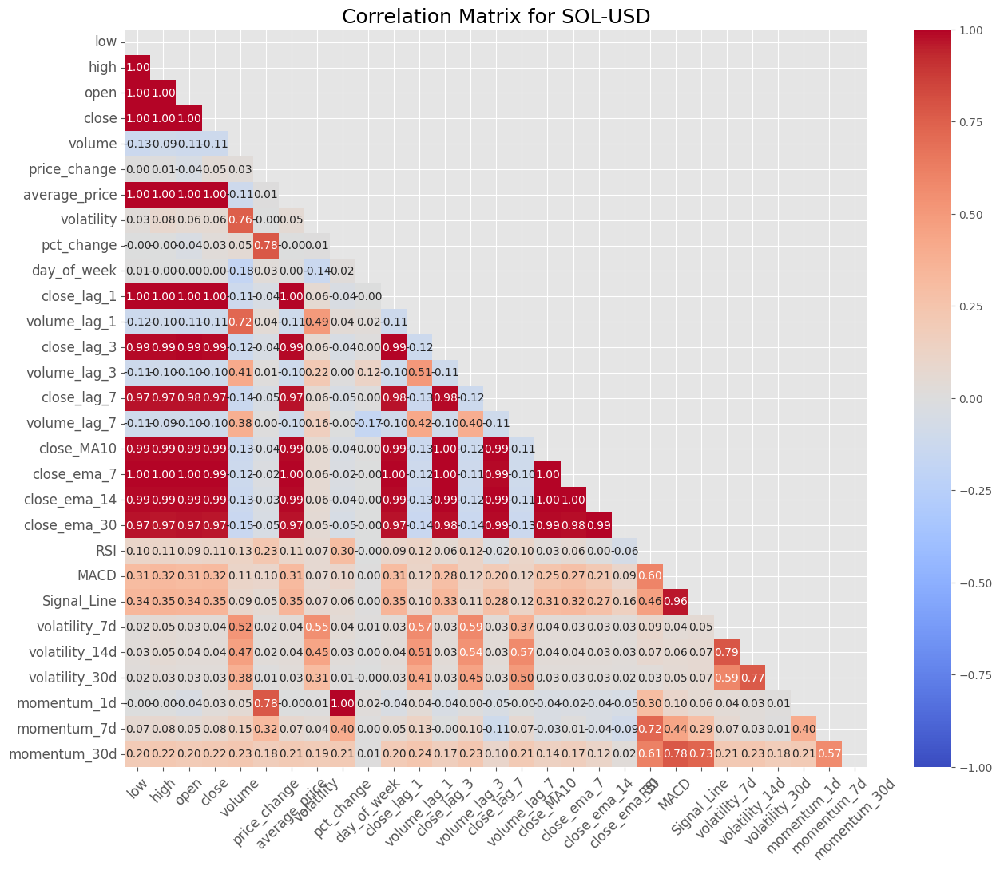

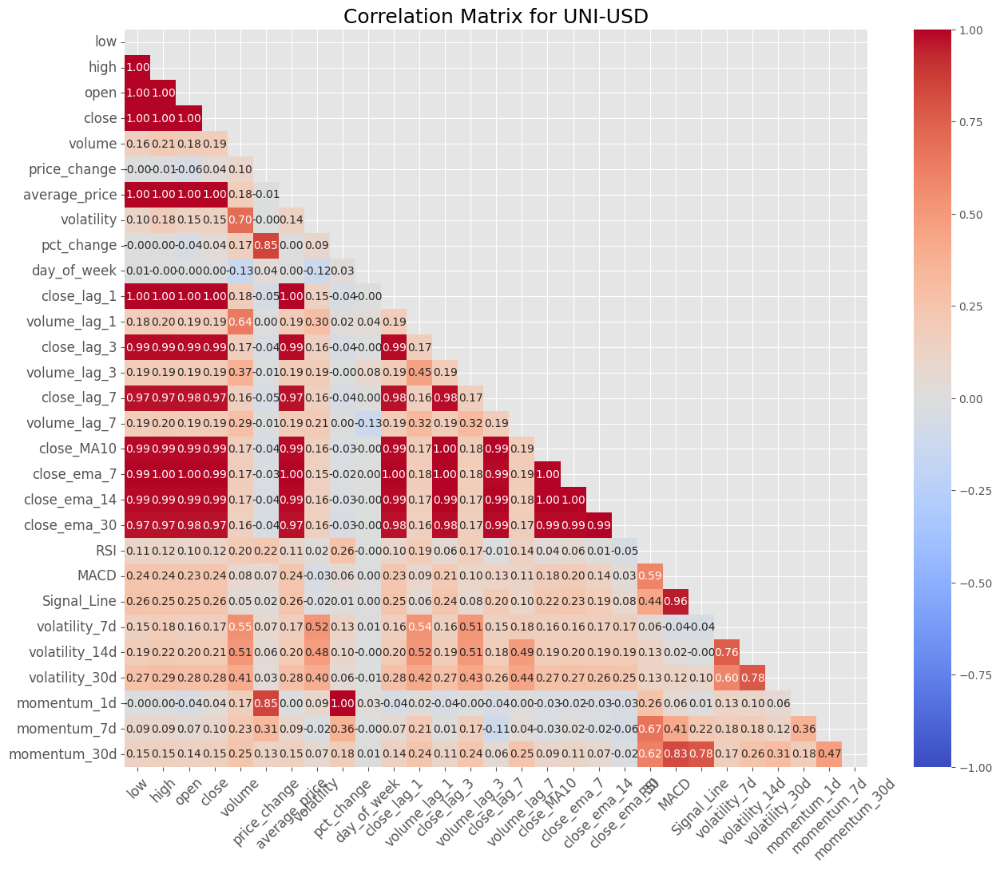

In [31]:
for coin in df_new_reset['product_id'].unique():
    plt.figure(figsize=(15, 12))  # Adjusted figure size for 30 numerical features
    coin_data = df_new_reset[df_new_reset['product_id'] == coin].select_dtypes(include=[np.number])
    corr_matrix = coin_data.corr()
    
    # Generate a heatmap with upper triangle masked
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1, mask=mask, annot_kws={'fontsize': 10})  # Adjusted annotation font size
    
    plt.title(f'Correlation Matrix for {coin}', fontsize=18)  # Increased title font size
    plt.xticks(rotation=45, fontsize=12)  # Increased x-axis font size
    plt.yticks(rotation=0, fontsize=12)  # Increased y-axis font size
    # plt.savefig(f'pictures/{coin}_pct_change_distribution.png')
    plt.show()

In [ ]:
# # Dictionary to hold correlation matrices
# correlation_matrices = {}

# # Calculate and store correlation matrices for each cryptocurrency
# for coin in df_new_reset['product_id'].unique():
#     # Filter data for the current cryptocurrency and select numeric types
#     coin_data = df_new_reset[df_new_reset['product_id'] == coin].select_dtypes(include=[np.number])
#     correlation_matrices[coin] = coin_data.corr()

# # Option 1: Display each matrix as a DataFrame in Jupyter Notebook
# for coin, matrix in correlation_matrices.items():
#     print(f"Correlation Matrix for {coin}:")
#     display(matrix)  # This uses IPython.display.display to show DataFrames nicely in Jupyter

# # # Option 2: Export each matrix to a CSV file
# # for coin, matrix in correlation_matrices.items():
# #     matrix.to_csv(f'correlation_matrix_{coin}.csv')
